# **Proyecto 01: Analisis de similitud entre documentos**

### Objetivos del proyecto:


* Aplicar técnicas de tokenización y normalización para preprocesar documentos de texto.

* Evaluar la similitud entre documentos utilizando 2 diferentes datasets, destacando las diferencias en los resultados según la naturaleza del texto.

* Analizar la efectividad de las técnicas de procesamiento para la identificación de similitud y proponer ajustes para mejorar el rendimiento en datasets más complejos como el de reseñas.

* Visualizar los resultados mediante matrices de similitud para una interpretación clara y comparativa.



# **Librerias e instancias a importar e instalar**


In [ ]:
!pip install nltk

In [ ]:
!pip install PyPDF2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 3.4 MB/s eta 0:00:00


In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 487.4/487.4 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 15.9 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.0
    Uninstalling fsspec-2025.3.0:
      Successfully uninstalled fsspec-2025.3.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.0 requires fsspec==2025.3.0, but you have fsspec 2024.12.0 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is

In [ ]:
import pandas as pd
import PyPDF2
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import unicodedata

# **Carga del dataset**

In [ ]:
from datasets import load_dataset

# Cargar el dataset BBC News
bbc_dataset = load_dataset("SetFit/bbc-news")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/880 [00:00<?, ?B/s]

train.jsonl:   0%|          | 0.00/2.87M [00:00<?, ?B/s]

test.jsonl:   0%|          | 0.00/2.28M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/1225 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1000 [00:00<?, ? examples/s]

In [ ]:
# Convertir a DataFrame para facilitar el análisis
bbc_data = bbc_dataset['train'].to_pandas()
display(bbc_data)
print(bbc_data['label_text'])
print(set(bbc_dataset['train']['label_text']))

,text,label,label_text
0,wales want rugby league training wales could f...,2,sport
1,china aviation seeks rescue deal scandal-hit j...,1,business
2,rock band u2 break ticket record u2 have smash...,3,entertainment
3,markets signal brazilian recovery the brazilia...,1,business
4,tough rules for ringtone sellers firms that fl...,0,tech
...,...,...,...
1220,us economy shows solid gdp growth the us econo...,1,business
1221,microsoft releases bumper patches microsoft ha...,0,tech
1222,stuart joins norwich from addicks norwich have...,2,sport
1223,why few targets are better than many the econo...,1,business


0               sport
1            business
2       entertainment
3            business
4                tech
            ...      
1220         business
1221             tech
1222            sport
1223         business
1224         politics
Name: label_text, Length: 1225, dtype: object
{'tech', 'entertainment', 'sport', 'politics', 'business'}


In [ ]:
display(bbc_data.describe())
display(bbc_data.info())

,label
count,1225.000000
mean,1.986939
std,1.374306
min,0.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,4.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1225 entries, 0 to 1224
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   text        1225 non-null   object
 1   label       1225 non-null   int64 
 2   label_text  1225 non-null   object
dtypes: int64(1), object(2)
memory usage: 28.8+ KB


None

In [ ]:
display(bbc_data[bbc_data["label"]==1])

,text,label,label_text
1,china aviation seeks rescue deal scandal-hit j...,1,business
3,markets signal brazilian recovery the brazilia...,1,business
9,bbc poll indicates economic gloom citizens in ...,1,business
18,ask jeeves tips online ad revival ask jeeves h...,1,business
21,ad firm wpp s profits surge 15% uk advertising...,1,business
...,...,...,...
1201,crossrail link to get go-ahead the £10bn cro...,1,business
1212,jp morgan admits us slavery links thousands of...,1,business
1214,safety alert as gm recalls cars the world s bi...,1,business
1220,us economy shows solid gdp growth the us econo...,1,business


In [ ]:
data=bbc_data[bbc_data["label"]==1]

# **Tokenizar y Normalizar**




**Convertir el texto a minúsculas.**





In [ ]:
def minus(text):
    return text.lower()
tokens_filtrados = [minus(texto).split() for texto in data['text']]
display(tokens_filtrados)

[['china',
  'aviation',
  'seeks',
  'rescue',
  'deal',
  'scandal-hit',
  'jet',
  'fuel',
  'supplier',
  'china',
  'aviation',
  'oil',
  'has',
  'offered',
  'to',
  'repay',
  'its',
  'creditors',
  '$220m',
  '(£117m)',
  'of',
  'the',
  '$550m',
  'it',
  'lost',
  'on',
  'trading',
  'in',
  'oil',
  'futures.',
  'the',
  'firm',
  'said',
  'it',
  'hoped',
  'to',
  'pay',
  '$100m',
  'now',
  'and',
  'another',
  '$120m',
  'over',
  'eight',
  'years.',
  'with',
  'assets',
  'of',
  '$200m',
  'and',
  'liabilities',
  'totalling',
  '$648m',
  'it',
  'needs',
  'creditors',
  'backing',
  'for',
  'the',
  'offer',
  'to',
  'avoid',
  'going',
  'into',
  'bankruptcy.',
  'the',
  'trading',
  'scandal',
  'is',
  'the',
  'biggest',
  'to',
  'hit',
  'singapore',
  'since',
  'the',
  '$1.2bn',
  'collapse',
  'of',
  'barings',
  'bank',
  'in',
  '1995.',
  'chen',
  'jiulin',
  'chief',
  'executive',
  'of',
  'china',
  'aviation',
  'oil',
  '(cao)',


In [ ]:
tokens = []

**Eliminar signos de puntuación y stopwords.**

In [ ]:
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))

def eliminar_stopwords(tokens):
    return [token for token in tokens if token not in stop_words]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def remove_noise(text):
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    return text

tokens_filtrados = [remove_noise(' '.join(texto)).split() for texto in tokens_filtrados]


def remove_accents(text):
    return ''.join(c for c in unicodedata.normalize('NFD', text) if unicodedata.category(c) != 'Mn')

tokens_filtrados=[remove_accents(' '.join(tokens)).lower() for tokens in tokens_filtrados]

tokens_filtrados=[text.split() for text in tokens_filtrados]

tokens_filtrados=[eliminar_stopwords(tokens) for tokens in tokens_filtrados]

display(f"Tokens del primer documento filtrado sin stopwords:{tokens_filtrados[0]}")
print()
display(f"Tokens del segundo documento filtrado sin stopwords:{tokens_filtrados[1]}")

"Tokens del primer documento filtrado sin stopwords:['china', 'aviation', 'seeks', 'rescue', 'deal', 'scandalhit', 'jet', 'fuel', 'supplier', 'china', 'aviation', 'oil', 'offered', 'repay', 'creditors', 'lost', 'trading', 'oil', 'futures', 'firm', 'said', 'hoped', 'pay', 'another', 'eight', 'years', 'assets', 'liabilities', 'totalling', 'needs', 'creditors', 'backing', 'offer', 'avoid', 'going', 'bankruptcy', 'trading', 'scandal', 'biggest', 'hit', 'singapore', 'since', 'bn', 'collapse', 'barings', 'bank', 'chen', 'jiulin', 'chief', 'executive', 'china', 'aviation', 'oil', 'cao', 'arrested', 'changi', 'airport', 'singapore', 'police', 'december', 'returning', 'china', 'headed', 'cao', 'announced', 'trading', 'debacle', 'latenovember', 'firm', 'betting', 'heavily', 'fall', 'price', 'oil', 'october', 'prices', 'rose', 'sharply', 'instead', 'among', 'creditors', 'whose', 'backing', 'cao', 'needs', 'restructuring', 'plan', 'banking', 'giants', 'barclay', 'capital', 'sumitomo', 'mitsui', 'w

"Tokens del segundo documento filtrado sin stopwords:['markets', 'signal', 'brazilian', 'recovery', 'brazilian', 'stock', 'market', 'risen', 'record', 'high', 'investors', 'display', 'growing', 'confidence', 'durability', 'country', 'economic', 'recovery', 'main', 'bovespa', 'index', 'sao', 'paolo', 'stock', 'exchange', 'closed', 'points', 'friday', 'topping', 'previous', 'record', 'market', 'close', 'reached', 'previous', 'day', 'market', 'buoyancy', 'reflects', 'optimism', 'brazilian', 'economy', 'could', 'grow', 'much', 'brazil', 'recovering', 'last', 'year', 'recession', 'worst', 'decade', 'economic', 'output', 'declined', 'president', 'luiz', 'inacio', 'lula', 'da', 'silva', 'elected', 'brazil', 'first', 'workingclass', 'president', 'strongly', 'criticised', 'pursuing', 'hardline', 'economic', 'policy', 'investors', 'praised', 'handling', 'economy', 'foreign', 'investment', 'risen', 'unemployment', 'fallen', 'inflation', 'brought', 'control', 'analysts', 'believe', 'stock', 'marke

**Analizar si hay palabras con acentos**

In [ ]:
def contiene_acentos(palabra):
    return bool(re.search(r'[áéíóú]', palabra))

all_words = [word for sublist in tokens_filtrados for word in sublist]

palabras_con_acentos = [palabra for palabra in all_words if contiene_acentos(palabra)]

print(palabras_con_acentos)

[]


**Aplicar lematización**

In [ ]:
#Importacion de funcion para Lematizar
nltk.download('wordnet')

lemmatizer = WordNetLemmatizer()

def lemmatization(tokens):
    return [lemmatizer.lemmatize(palabra) for palabra in tokens]

[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
#Aplicar la función lemmatize a todos los tokens filtrados sin acentos, sin stopwords y stemmizados
tokens_filtrados=[lemmatization(tokens) for tokens in tokens_filtrados]

#Mostrar los primeros 100 tokens de los primeros 2 documentos sin stopwords, stemmizados y lematizados
display(f"Tokens del primer documento filtrado sin stopwords, stemmizados y lematizados:{tokens_filtrados[0][:100]}")
print()
display(f"Tokens del segundo documento filtrado sin stopwords, stemmizados y lematizados:{tokens_filtrados[1][:100]}")

"Tokens del primer documento filtrado sin stopwords, stemmizados y lematizados:['china', 'aviation', 'seek', 'rescue', 'deal', 'scandalhit', 'jet', 'fuel', 'supplier', 'china', 'aviation', 'oil', 'offered', 'repay', 'creditor', 'lost', 'trading', 'oil', 'future', 'firm', 'said', 'hoped', 'pay', 'another', 'eight', 'year', 'asset', 'liability', 'totalling', 'need', 'creditor', 'backing', 'offer', 'avoid', 'going', 'bankruptcy', 'trading', 'scandal', 'biggest', 'hit', 'singapore', 'since', 'bn', 'collapse', 'baring', 'bank', 'chen', 'jiulin', 'chief', 'executive', 'china', 'aviation', 'oil', 'cao', 'arrested', 'changi', 'airport', 'singapore', 'police', 'december', 'returning', 'china', 'headed', 'cao', 'announced', 'trading', 'debacle', 'latenovember', 'firm', 'betting', 'heavily', 'fall', 'price', 'oil', 'october', 'price', 'rose', 'sharply', 'instead', 'among', 'creditor', 'whose', 'backing', 'cao', 'need', 'restructuring', 'plan', 'banking', 'giant', 'barclay', 'capital', 'sumitomo',

"Tokens del segundo documento filtrado sin stopwords, stemmizados y lematizados:['market', 'signal', 'brazilian', 'recovery', 'brazilian', 'stock', 'market', 'risen', 'record', 'high', 'investor', 'display', 'growing', 'confidence', 'durability', 'country', 'economic', 'recovery', 'main', 'bovespa', 'index', 'sao', 'paolo', 'stock', 'exchange', 'closed', 'point', 'friday', 'topping', 'previous', 'record', 'market', 'close', 'reached', 'previous', 'day', 'market', 'buoyancy', 'reflects', 'optimism', 'brazilian', 'economy', 'could', 'grow', 'much', 'brazil', 'recovering', 'last', 'year', 'recession', 'worst', 'decade', 'economic', 'output', 'declined', 'president', 'luiz', 'inacio', 'lula', 'da', 'silva', 'elected', 'brazil', 'first', 'workingclass', 'president', 'strongly', 'criticised', 'pursuing', 'hardline', 'economic', 'policy', 'investor', 'praised', 'handling', 'economy', 'foreign', 'investment', 'risen', 'unemployment', 'fallen', 'inflation', 'brought', 'control', 'analyst', 'bel

# Cálculo de TF-IDF Manualmente.

**Implementar fórmulas de TF-IDF.**

In [ ]:
def calcular_tf(tokens):
    total_palabras = len(tokens)
    tf_dict = {}
    for palabra in tokens:
        tf_dict[palabra] = tf_dict.get(palabra, 0) + 1
    for palabra in tf_dict:
        tf_dict[palabra] = tf_dict[palabra] / total_palabras
    return tf_dict

    import math

def calcular_idf(documentos_tokens):
    idf_dict = {}
    total_documentos = len(documentos_tokens)
    palabras_por_doc = [set(doc) for doc in documentos_tokens]
    todas_palabras = set().union(*(palabras_por_doc))
    for palabra in todas_palabras:
        docs_con_palabra = sum(1 for doc in palabras_por_doc if palabra in doc)
        idf_dict[palabra] = np.log(total_documentos / (docs_con_palabra + 1))
    return idf_dict

def calcular_tf_idf(documentos_tokens):
    tf_idf_docs = []
    idf = calcular_idf(documentos_tokens)
    for tokens in documentos_tokens:
        tf = calcular_tf(tokens)
        tf_idf = {}
        for palabra in tf:
            tf_idf[palabra] = tf[palabra] * idf.get(palabra, 0)
        tf_idf_docs.append(tf_idf)
    return tf_idf_docs

# Calcular TF-IDF para tus documentos preprocesados
tf_idf_docs = calcular_tf_idf(tokens_filtrados)
print(tf_idf_docs)

[{'china': np.float64(0.08697401839323335), 'aviation': np.float64(0.10324678308906368), 'seek': np.float64(0.021065510945997287), 'rescue': np.float64(0.028837554787998487), 'deal': np.float64(0.011779510200851741), 'scandalhit': np.float64(0.03703615395716348), 'jet': np.float64(0.05537435316066477), 'fuel': np.float64(0.04213102189199457), 'supplier': np.float64(0.057675109575996975), 'oil': np.float64(0.05827041972379671), 'offered': np.float64(0.025025423267356767), 'repay': np.float64(0.031863413803731054), 'creditor': np.float64(0.0750762698020703), 'lost': np.float64(0.01682682409819177), 'trading': np.float64(0.047029337671576986), 'future': np.float64(0.013319334327701207), 'firm': np.float64(0.02330729813787167), 'said': np.float64(0.0014225399970794767), 'hoped': np.float64(0.026690673650298632), 'pay': np.float64(0.01414023653079321), 'another': np.float64(0.01682682409819177), 'eight': np.float64(0.023067480995211314), 'year': np.float64(0.0023765203814816015), 'asset': n

# Cálculo de Similitud usando alguna medida de distancia.

**Comparar documentos basándose en sus vectores TF-IDF.**

In [ ]:
def producto_punto(vec1, vec2):
    return sum(vec1[key] * vec2.get(key, 0) for key in vec1)

def norma(vec):
    return np.sqrt(sum(val ** 2 for val in vec.values()))

def similitud_coseno(vec1, vec2):
    prod_punto = producto_punto(vec1, vec2)
    norma1 = norma(vec1)
    norma2 = norma(vec2)
    if norma1 == 0 or norma2 == 0:
        return 0
    return prod_punto / (norma1 * norma2)

def matriz_similitud(tf_idf_docs):
    n = len(tf_idf_docs)
    matriz = [[0] * n for _ in range(n)]
    for i in range(n):
        for j in range(n):
            matriz[i][j] = similitud_coseno(tf_idf_docs[i], tf_idf_docs[j])
    return matriz

# calcular similitud
matriz = matriz_similitud(tf_idf_docs)

# Visualización de Similitud

**Matriz de calor mostrando relaciones entre documentos.**

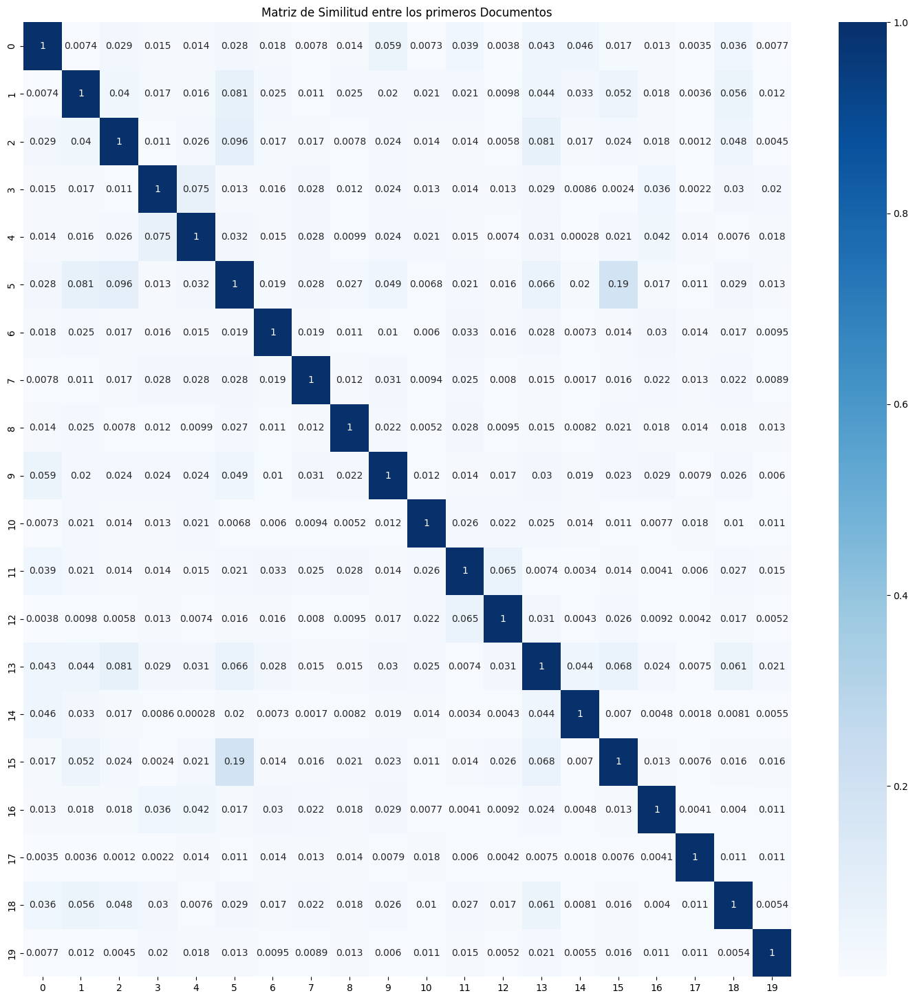

In [ ]:
# Seleccionar solo los primeros 10 filas y columnas de la matriz
matriz_reducida = [fila[:20] for fila in matriz[:20]]

# Crear el heatmap con la matriz reducida
plt.figure(figsize=(18, 18))
sns.heatmap(matriz_reducida, annot=True, cmap='Blues')
plt.title('Matriz de Similitud entre los primeros Documentos')
plt.show()

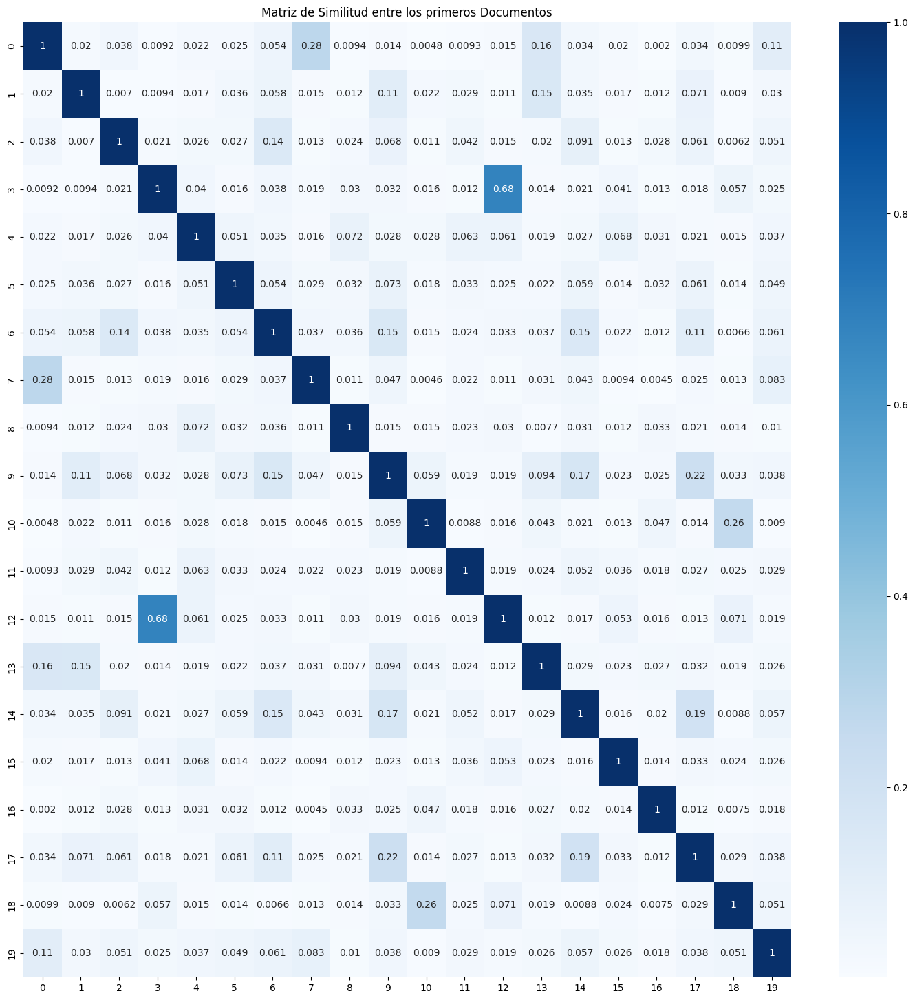

In [ ]:
matriz = matriz_similitud(tf_idf_docs)
# Seleccionar solo los primeros 20 filas y columnas de la matriz
matriz_reducida = [fila[20:40] for fila in matriz[20:40]]
# Crear el heatmap con la matriz reducida
plt.figure(figsize=(18, 18))
sns.heatmap(matriz_reducida, annot=True, cmap='Blues')
plt.title('Matriz de Similitud entre los primeros Documentos')
plt.show()

In [ ]:
def imprimir_matriz(matriz):
    for fila in matriz:
        print([round(val, 3) for val in fila])

imprimir_matriz(matriz)

[np.float64(1.0), np.float64(0.007), np.float64(0.029), np.float64(0.015), np.float64(0.014), np.float64(0.028), np.float64(0.018), np.float64(0.008), np.float64(0.014), np.float64(0.059), np.float64(0.007), np.float64(0.039), np.float64(0.004), np.float64(0.043), np.float64(0.046), np.float64(0.017), np.float64(0.013), np.float64(0.003), np.float64(0.036), np.float64(0.008), np.float64(0.019), np.float64(0.008), np.float64(0.018), np.float64(0.035), np.float64(0.037), np.float64(0.076), np.float64(0.069), np.float64(0.009), np.float64(0.021), np.float64(0.074), np.float64(0.047), np.float64(0.008), np.float64(0.037), np.float64(0.03), np.float64(0.015), np.float64(0.017), np.float64(0.029), np.float64(0.029), np.float64(0.005), np.float64(0.028), np.float64(0.024), np.float64(0.014), np.float64(0.03), np.float64(0.007), np.float64(0.039), np.float64(0.005), np.float64(0.03), np.float64(0.01), np.float64(0.019), np.float64(0.019), np.float64(0.014), np.float64(0.007), np.float64(0.006)

In [ ]:
# Umbral de similitud
umbral = 0.5

for i in range(len(matriz)):
    for j in range(i + 1, len(matriz)):  # Evitar comparar un documento consigo mismo y evitar duplicados
        if matriz[i][j] >= umbral:
            print(f"Documento {i} - Documento {j} - similitud: {matriz[i][j]}")

Documento 6 - Documento 49 - similitud: 0.5693799750403595
Documento 8 - Documento 35 - similitud: 0.541592629536188
Documento 8 - Documento 86 - similitud: 0.5224273001140309
Documento 8 - Documento 142 - similitud: 0.5118481958604105
Documento 8 - Documento 145 - similitud: 0.5635905002367511
Documento 8 - Documento 239 - similitud: 0.6900527495671049
Documento 8 - Documento 276 - similitud: 0.5110727797766472
Documento 13 - Documento 191 - similitud: 0.9999999999999999
Documento 15 - Documento 44 - similitud: 0.5342422070079998
Documento 23 - Documento 32 - similitud: 0.6837549217323662
Documento 24 - Documento 78 - similitud: 0.5836758795176475
Documento 24 - Documento 85 - similitud: 0.5002428859342838
Documento 24 - Documento 91 - similitud: 0.5249572434640112
Documento 24 - Documento 232 - similitud: 0.5579218182531991
Documento 28 - Documento 82 - similitud: 0.6067009330487225
Documento 35 - Documento 142 - similitud: 0.7208843385964152
Documento 35 - Documento 163 - similitud:

In [ ]:
i=147
j=204
print("similitud: ", matriz[i][j])
print("documento 1:")
display(data['text'].iloc[i])
print()
print("documento 2:")
display(data['text'].iloc[j])

similitud:  0.9977701758433969
documento 1:


'uk interest rates held at 4.75% the bank of england has left interest rates on hold again at 4.75%  in a widely-predicted move.  rates went up five times from november 2003 - as the bank sought to cool the housing market and consumer debt - but have remained unchanged since august. recent data has indicated a slowdown in manufacturing and consumer spending  as well as in mortgage approvals. and retail sales disappointed over christmas  with analysts putting the drop down to less consumer confidence.  rising interest rates and the accompanying slowdown in the housing market have knocked consumers  optimism  causing a sharp fall in demand for expensive goods  according to a report earlier this week from the british retail consortium. the brc said britain s retailers had endured their worst christmas in a decade.   today s no change decision is correct   said david frost  director general of the british chambers of commerce (bcc).  but  if there are clear signs that the economy slows  th


documento 2:


'bank holds interest rate at 4.75% the bank of england has left interest rates on hold again at 4.75%  in a widely-predicted move.  rates went up five times from november 2003 - as the bank sought to cool the housing market and consumer debt - but have remained unchanged since august. recent data has indicated a slowdown in manufacturing and consumer spending  as well as in mortgage approvals. and retail sales disappointed over christmas  with analysts putting the drop down to less consumer confidence.  rising interest rates and the accompanying slowdown in the housing market have knocked consumers  optimism  causing a sharp fall in demand for expensive goods  according to a report earlier this week from the british retail consortium. the brc said britain s retailers had endured their worst christmas in a decade.   today s no change decision is correct   said david frost  director general of the british chambers of commerce (bcc).  but  if there are clear signs that the economy slows  

In [ ]:
i=158
j=259
print("similitud: ", matriz[i][j])
print("documento 1:")
display(data['text'].iloc[i])
print()
print("documento 2:")
display(data['text'].iloc[j])

similitud:  0.9930362042622823
documento 1:


'china continues breakneck growth china s economy has expanded by a breakneck 9.5% during 2004  faster than predicted and well above 2003 s 9.1%.  the news may mean more limits on investment and lending as beijing tries to take the economy off the boil. china has sucked in raw materials and energy to feed its expansion  which could have knock-on effects on the rest of the world if it overheats. but officials pointed out that industrial growth had slowed  with services providing much of the impetus. growth in industrial output - the main target of government efforts to impose curbs on credit and investments - was 11.5% in 2004  down from 17% the previous year.  still  consumer prices - at 2.4% - rose faster than in 2004  adding to concern that a sharp rise in producer prices of 7.1% could stoke inflation. and overall investment in fixed assets was still high  up 21.3% from the previous year - although some way off the peak of 43% seen in the first quarter of 2004. the result could be hi


documento 2:


'china continues rapid growth china s economy has expanded by a breakneck 9.5% during 2004  faster than predicted and well above 2003 s 9.1%.  the news may mean more limits on investment and lending as beijing tries to take the economy off the boil. china has sucked in raw materials and energy to feed its expansion  which could have knock-on effects on the rest of the world if it overheats. but officials pointed out that industrial growth had slowed  with services providing much of the impetus. growth in industrial output - the main target of government efforts to impose curbs on credit and investments - was 11.5% in 2004  down from 17% the previous year.  still  consumer prices - at 2.4% - rose faster than in 2004  adding to concern that a sharp rise in producer prices of 7.1% could stoke inflation. and overall investment in fixed assets was still high  up 21.3% from the previous year - although some way off the peak of 43% seen in the first quarter of 2004. the result could be higher

In [ ]:
i=40
j=203
print("similitud: ", matriz[i][j])
print("documento 1:")
display(data['text'].iloc[i])
print()
print("documento 2:")
display(data['text'].iloc[j])

similitud:  1.0
documento 1:


'troubled marsh under sec scrutiny the us stock market regulator is investigating troubled insurance broker marsh & mclennan s shareholder transactions  the firm has said.  the securities and exchange commission has asked for information about transactions involving holders of 5% or more of the firm s shares. marsh has said it is co-operating fully with the sec investigation. marsh is also the focus of an inquiry the new york attorney-general into whether insurers rigged the market. since that inquiry was launched in october  marsh has replaced its chief executive and held a boardroom shake-out to meet criticism by lessening the number of company executives on the board. prosecutors allege that marsh - the world s biggest insurance broker - and other us insurance firms may have fixed bids for corporate cover. this is the issue at the heart of the inquiry by new york s top law officer  eliot spitzer  and a separate prosecution of five insurers by the state of california. the sec s inves


documento 2:


'troubled marsh under sec scrutiny the us stock market regulator is investigating troubled insurance broker marsh & mclennan s shareholder transactions  the firm has said.  the securities and exchange commission has asked for information about transactions involving holders of 5% or more of the firm s shares. marsh has said it is co-operating fully with the sec investigation. marsh is also the focus of an inquiry the new york attorney-general into whether insurers rigged the market. since that inquiry was launched in october  marsh has replaced its chief executive and held a boardroom shake-out to meet criticism by lessening the number of company executives on the board. prosecutors allege that marsh - the world s biggest insurance broker - and other us insurance firms may have fixed bids for corporate cover. this is the issue at the heart of the inquiry by new york s top law officer  eliot spitzer  and a separate prosecution of five insurers by the state of california. the sec s inves

In [ ]:
i=55
j=66
print("similitud: ", matriz[i][j])
print("documento 1:")
display(data['text'].iloc[i])
print()
print("documento 2:")
display(data['text'].iloc[j])

similitud:  0.7461117740036362
documento 1:


'ebbers denies worldcom fraud former worldcom chief bernie ebbers has denied claims that he knew accountants were doctoring the books at the firm.  speaking in court  mr ebbers rejected allegations he pressured ex-chief financial officer scott sullivan to falsify company financial statements. mr sullivan  made accounting decisions   he told the federal court  saying his finance chief had  a keen command of the numbers . mr ebbers has denied charges of fraud and conspiracy. during his second day of questioning in the new york trial mr ebbers played down his working relationship with mr sullivan and denied he frequently met him to discuss company business when questioned by the prosecution.   in a lot of weeks  we would speak ... three or four times   mr ebbers said  adding that conversations about finances were rarely one-on-one and were usually discussed by a  group of people  instead.  mr ebbers relationship to mr sullivan is key to the case surrounding financial corruption that led t


documento 2:


'ebbers  aware  of worldcom fraud former worldcom boss bernie ebbers was directly involved in the $11bn financial fraud at the firm  his closest associate has told a us court.  giving evidence in the criminal trial of mr ebbers  ex-finance chief scott sullivan implicated his colleague in the accounting scandal at the firm. mr sullivan  worldcom s former number two  is the government s chief witness in its case against mr ebbers. mr ebbers has denied multiple charges of conspiracy and fraud.  senior worldcom executives are accused of orchestrating a huge fraud at the former telecoms company in which they exaggerated revenues and hid the cost of expenses. the firm was forced into bankruptcy  the largest in us history. mr sullivan  42  pleaded guilty to fraud last year and agreed to assist the government with its case against mr ebbers.  prosecutors have alleged that mr ebbers  63  directed mr sullivan to hide the true state of the company s finances by providing false information to the 

# Carga del segundo Dataset IMDb Reviews Dataset

A partir de esta sección, se carga el dataset de IMDb y se compara con el modelo original.

In [ ]:
!pip install tensorflow_datasets

In [ ]:
import tensorflow_datasets as tfds

# Cargar el dataset de IMDb
dataset, info = tfds.load("imdb_reviews", with_info=True, as_supervised=True)

# Mostrar información del dataset
print(info)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/imdb_reviews/plain_text/incomplete.QB99RY_1.0.0/imdb_reviews-train.tfrecor…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/imdb_reviews/plain_text/incomplete.QB99RY_1.0.0/imdb_reviews-test.tfrecord…

Generating unsupervised examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/imdb_reviews/plain_text/incomplete.QB99RY_1.0.0/imdb_reviews-unsupervised.…

Dataset imdb_reviews downloaded and prepared to /root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0. Subsequent calls will reuse this data.
tfds.core.DatasetInfo(
    name='imdb_reviews',
    full_name='imdb_reviews/plain_text/1.0.0',
    description="""
    Large Movie Review Dataset. This is a dataset for binary sentiment
    classification containing substantially more data than previous benchmark
    datasets. We provide a set of 25,000 highly polar movie reviews for training,
    and 25,000 for testing. There is additional unlabeled data for use as well.
    """,
    config_description="""
    Plain text
    """,
    homepage='http://ai.stanford.edu/~amaas/data/sentiment/',
    data_dir='/root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0',
    file_format=tfrecord,
    download_size=80.23 MiB,
    dataset_size=129.83 MiB,
    features=FeaturesDict({
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
        'text': Text(shape=(), dtype=string),
    }),
   

In [ ]:
# Función para convertir tf.data.Dataset a un DataFrame
def dataset_to_dataframe(tf_dataset):
    texts = []
    labels = []
    for text, label in tf_dataset:
        texts.append(text.numpy().decode('utf-8'))  # Decodificar el texto de bytes a string
        labels.append(label.numpy())               # Convertir la etiqueta a un valor de Python
    return pd.DataFrame({'text': texts, 'label': labels})

# Mostrar los primeros registros del DataFrame
imdb_data = dataset_to_dataframe(dataset['train'])
display(imdb_data)

,text,label
0,This was an absolutely terrible movie. Don't b...,0
1,"I have been known to fall asleep during films,...",0
2,Mann photographs the Alberta Rocky Mountains i...,0
3,This is the kind of film for a snowy Sunday af...,1
4,"As others have mentioned, all the women that g...",1
...,...,...
24995,"I have a severe problem with this show, severa...",0
24996,"The year is 1964. Ernesto ""Che"" Guevara, havin...",1
24997,Okay. So I just got back. Before I start my re...,0
24998,When I saw this trailer on TV I was surprised....,0


In [ ]:
#aletorizar los documentos
imdb_data = imdb_data.sample(frac=1, random_state=1000)
#reducir el data para que no tarde el programa
imdb_data=imdb_data.head(1500)
display(imdb_data)

,text,label
23446,The only good thing about this movie was the s...,0
13950,This is by far one of my favorite of the Ameri...,1
23062,"If you like Sci-Fi, Monsters, and Ancient Lege...",1
7177,*Can anybody tell me WHERE is the COMEDY ??!! ...,0
7288,"This is a bizzare look at Al's ""life"", back wh...",1
...,...,...
20950,The movie is about two brothers that are suppo...,0
5241,I saw this film at its premier at Sundance 09....,0
1095,Wow. Rarely have I felt the need to comment on...,0
24207,"Well, I thoroughly enjoyed this movie. It was ...",1


# Tokenización y Normalización

**Convertir el Texto a Minúsculas**

In [ ]:
tokens_filtrados = [minus(texto).split() for texto in imdb_data['text']]
display(tokens_filtrados)

[['the',
  'only',
  'good',
  'thing',
  'about',
  'this',
  'movie',
  'was',
  'the',
  'shot',
  'of',
  'goldie',
  'hawn',
  'standing',
  'in',
  'her',
  'little',
  'french',
  'cut',
  'bikini',
  'panties',
  'and',
  'struggling',
  'to',
  'keep',
  'a',
  'dozen',
  'other',
  'depraved',
  'women',
  'from',
  'removing',
  'her',
  'skimpy',
  'little',
  'cotton',
  'top',
  'while',
  'she',
  'giggled',
  'and',
  'cooed.',
  'ooooof!',
  'her',
  'loins',
  'rival',
  'those',
  'of',
  'nina',
  'hartley.',
  'this',
  'movie',
  'came',
  'out',
  'when',
  'i',
  'was',
  'fourteen',
  'and',
  'that',
  'shot',
  'nearly',
  'killed',
  'me.',
  "i'd",
  'forgotten',
  'about',
  'it',
  'all',
  'tucked',
  'away',
  'in',
  'the',
  'naughty',
  'roladex',
  'of',
  'my',
  'mind',
  'until',
  'seeing',
  'it',
  'the',
  'other',
  'day',
  'on',
  'tv,',
  'where',
  'they',
  'actually',
  'blurred',
  'her',
  'midsection',
  'in',
  'that',
  'scene,',


**Eliminamos tambien signos de puntuación y stopwords.**

In [ ]:
tokens_filtrados = [remove_noise(' '.join(texto)).split() for texto in tokens_filtrados]

tokens_filtrados=[remove_accents(' '.join(tokens)).lower() for tokens in tokens_filtrados]

tokens_filtrados=[text.split() for text in tokens_filtrados]

tokens_filtrados=[eliminar_stopwords(tokens) for tokens in tokens_filtrados]

display(f"Tokens del primer documento filtrado sin stopwords:{tokens_filtrados[0]}")
print()
display(f"Tokens del segundo documento filtrado sin stopwords:{tokens_filtrados[1]}")

"Tokens del primer documento filtrado sin stopwords:['good', 'thing', 'movie', 'shot', 'goldie', 'hawn', 'standing', 'little', 'french', 'cut', 'bikini', 'panties', 'struggling', 'keep', 'dozen', 'depraved', 'women', 'removing', 'skimpy', 'little', 'cotton', 'top', 'giggled', 'cooed', 'ooooof', 'loins', 'rival', 'nina', 'hartley', 'movie', 'came', 'fourteen', 'shot', 'nearly', 'killed', 'id', 'forgotten', 'tucked', 'away', 'naughty', 'roladex', 'mind', 'seeing', 'day', 'tv', 'actually', 'blurred', 'midsection', 'scene', 'good', 'grief', 'reminding', 'smokin', 'hottie', 'woman', 'goldie', 'hawn', 'kurt', 'russell', 'must', 'fun', 'life']"

"Tokens del segundo documento filtrado sin stopwords:['far', 'one', 'favorite', 'american', 'pie', 'spin', 'offs', 'mainly', 'others', 'main', 'character', 'one', 'young', 'stiflers', 'always', 'seems', 'unrealistic', 'nature', 'br', 'br', 'example', 'ap', 'naked', 'mile', 'teenage', 'guy', 'surrounded', 'naked', 'college', 'chicks', 'one', 'particular', 'hot', 'trail', 'rid', 'virginity', 'problem', 'ends', 'stopping', 'middeed', 'rides', 'horse', 'back', 'sleep', 'girlfriend', 'keep', 'mind', 'gave', 'guilt', 'free', 'pass', 'weekend', 'appreciate', 'romantic', 'aspect', 'whole', 'thing', 'lets', 'realistic', 'people', 'watching', 'movies', 'arent', 'particularly', 'searching', 'romantic', 'storybr', 'br', 'whereas', 'recent', 'installment', 'finally', 'seems', 'realize', 'audience', 'good', 'old', 'erik', 'stifler', 'seems', 'wake', 'smell', 'roses', 'always', 'mr', 'levenstein', 'lends', 'perfectly', 'natural', 'eyebrow', 'humor', 'equation', 'scored', 'touchdown', 'new', 'movie']"

**Analizar si hay palabras con acentos**

In [ ]:
all_words = [word for sublist in tokens_filtrados for word in sublist]

palabras_con_acentos = [palabra for palabra in all_words if contiene_acentos(palabra)]

print(palabras_con_acentos)

[]


**Aplicar Lematizacion**

In [ ]:
#Aplicar la función lemmatize a todos los tokens filtrados sin acentos, sin stopwords y stemmizados
tokens_filtrados=[lemmatization(tokens) for tokens in tokens_filtrados]

#Mostrar los primeros 100 tokens de los primeros 2 documentos sin stopwords, stemmizados y lematizados
display(f"Tokens del primer documento filtrado sin stopwords y lematizados:{tokens_filtrados[0][:100]}")
print()
display(f"Tokens del segundo documento filtrado sin stopwords y lematizados:{tokens_filtrados[1][:100]}")

"Tokens del primer documento filtrado sin stopwords y lematizados:['good', 'thing', 'movie', 'shot', 'goldie', 'hawn', 'standing', 'little', 'french', 'cut', 'bikini', 'panty', 'struggling', 'keep', 'dozen', 'depraved', 'woman', 'removing', 'skimpy', 'little', 'cotton', 'top', 'giggled', 'cooed', 'ooooof', 'loin', 'rival', 'nina', 'hartley', 'movie', 'came', 'fourteen', 'shot', 'nearly', 'killed', 'id', 'forgotten', 'tucked', 'away', 'naughty', 'roladex', 'mind', 'seeing', 'day', 'tv', 'actually', 'blurred', 'midsection', 'scene', 'good', 'grief', 'reminding', 'smokin', 'hottie', 'woman', 'goldie', 'hawn', 'kurt', 'russell', 'must', 'fun', 'life']"

"Tokens del segundo documento filtrado sin stopwords y lematizados:['far', 'one', 'favorite', 'american', 'pie', 'spin', 'offs', 'mainly', 'others', 'main', 'character', 'one', 'young', 'stifler', 'always', 'seems', 'unrealistic', 'nature', 'br', 'br', 'example', 'ap', 'naked', 'mile', 'teenage', 'guy', 'surrounded', 'naked', 'college', 'chick', 'one', 'particular', 'hot', 'trail', 'rid', 'virginity', 'problem', 'end', 'stopping', 'middeed', 'ride', 'horse', 'back', 'sleep', 'girlfriend', 'keep', 'mind', 'gave', 'guilt', 'free', 'pas', 'weekend', 'appreciate', 'romantic', 'aspect', 'whole', 'thing', 'let', 'realistic', 'people', 'watching', 'movie', 'arent', 'particularly', 'searching', 'romantic', 'storybr', 'br', 'whereas', 'recent', 'installment', 'finally', 'seems', 'realize', 'audience', 'good', 'old', 'erik', 'stifler', 'seems', 'wake', 'smell', 'rose', 'always', 'mr', 'levenstein', 'lends', 'perfectly', 'natural', 'eyebrow', 'humor', 'equation', 'scored', 'touchdown', 'new', 'mo

# Cálculo de TF-IDF Manualmente.

In [ ]:
# Calcular TF-IDF para tus documentos preprocesados
tf_idf_docs = calcular_tf_idf(tokens_filtrados)

# Calculo de Similitud

In [ ]:
# calcuñar similitud
matriz = matriz_similitud(tf_idf_docs)

In [ ]:
# Seleccionar solo los primeros 10 filas y columnas de la matriz
matriz_reducida = [fila[:20] for fila in matriz[:20]]

# Crear el heatmap con la matriz reducida
plt.figure(figsize=(18, 18))
sns.heatmap(matriz_reducida, annot=True, cmap='Blues')
plt.title('Matriz de Similitud entre los primeros Documentos')
plt.show()

In [ ]:
# Seleccionar solo los primeros 20 filas y columnas de la matriz
matriz_reducida = [fila[200:220] for fila in matriz[200:220]]
# Crear el heatmap con la matriz reducida
plt.figure(figsize=(18, 18))
sns.heatmap(matriz_reducida, annot=True, cmap='Blues')
plt.title('Matriz de Similitud entre los primeros Documentos')
plt.show()

In [ ]:
def imprimir_matriz(matriz):
    for fila in matriz:
        print([round(val, 3) for val in fila])

imprimir_matriz(matriz)

In [ ]:
# Umbral de similitud
umbral = 0.5

for i in range(len(matriz)):
    for j in range(i + 1, len(matriz)):  # Evitar comparar un documento consigo mismo y evitar duplicados
        if matriz[i][j] >= umbral:
            print(f"Documento {i} - Documento {j} - Similitud: {matriz[i][j]}")

In [ ]:
i=438
j=1487
print("similitud: ", matriz[i][j])
print("documento 1:")
display(imdb_data['text'].iloc[i])
print()
print("documento 2:")
display(imdb_data['text'].iloc[j])

In [ ]:
i=591
j=627
print("similitud: ", matriz[i][j])
print("documento 1:")
display(imdb_data['text'].iloc[i])
print()
print("documento 2:")
display(imdb_data['text'].iloc[j])

# Comparación de los Resultados

### Distribución de Similitud:

En la matriz del dataset BBC News, los valores de similitud son generalmente más homogéneos, con una menor presencia de similitudes extremas.

Esto sugiere que los textos del dataset de noticias tienden a mantener una estructura y vocabulario más formal y estandarizado, lo que genera mayores coincidencias.
Por otro lado, en el dataset IMDb Reviews, las similitudes son más dispersas. Se observan valores de similitud notablemente bajos en comparación con los valores más altos, indicando que las reseñas de películas suelen variar significativamente en tono, estilo y contenido.

### Patrones de Similitud:

En el BBC News, hay una mayor densidad de similitudes altas, posiblemente porque los artículos suelen pertenecer a categorías bien definidas (en este caso es coherente ya que se uso la categoría business o negocios).

En IMDb Reviews, la diversidad de opiniones y emociones expresadas en las reseñas genera una menor similitud promedio, con pocos pares de documentos mostrando similitud significativa.

## Efecto de la Tokenización y Normalización:

Ambas matrices muestran un correcto procesamiento en la tokenización y normalización, reflejado en una distribución clara de similitud. Sin embargo, la naturaleza de los datos afecta los resultados.

En particular, la eliminación de ruido y normalización parece tener un mayor impacto en el dataset de reseñas, donde las expresiones emocionales o subjetivas son más complejas de comparar.

## Conclusiones


* Para el Dataset **BBC News**: La alta similitud entre documentos sugiere que este enfoque de procesamiento es efectivo para identificar categorías temáticas. Esta técnica sería útil para tareas como la clasificación automática de noticias o la detección de duplicados.

* Para el Dataset **IMDb Reviews:** Dado el menor nivel de similitud promedio, la técnica podría necesitar mejoras adicionales, como la incorporación de modelos semánticos más complejos (por ejemplo, **embeddings** o modelos como **BERT**) para capturar mejor el contexto emocional y subjetivo de las reseñas.